## Librerias

In [1]:
!pip install dataprep

     |████████████████████████████████| 9.5 MB 3.7 MB/s 
     |████████████████████████████████| 50 kB 5.8 MB/s 
     |████████████████████████████████| 78 kB 6.5 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 133 kB 41.1 MB/s 
     |████████████████████████████████| 1.0 MB 57.6 MB/s 
     |████████████████████████████████| 749 kB 37.4 MB/s 
     |████████████████████████████████| 943 kB 53.1 MB/s 
     |████████████████████████████████| 366 kB 41.5 MB/s 
     |████████████████████████████████| 95 kB 2.8 MB/s 
     |████████████████████████████████| 11.1 MB 44.3 MB/s 
     |████████████████████████████████| 1.1 MB 62.0 MB/s 
     |████████████████████████████████| 1.5 MB 24.0 MB/s 
     |████████████████████████████████| 965 kB 58.4 MB/s 
     |████████████████████████████████| 144 kB 62.0 MB/s 
     |████████████████████████████████| 94 kB 3.5 MB/s 
     |██████

In [2]:
pip install zipfile36

In [74]:
# Tratamiento de datos
# ==============================================================================
import numpy as np
import pandas as pd
# import statsmodels.api as sm
import requests
import zipfile 
from dataprep.eda import create_report

# Gráficos
# ==============================================================================
import matplotlib.pyplot as plt
import seaborn as sns

# Preprocesado y modelado
# ==============================================================================
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import ParameterGrid
from sklearn.feature_selection import SelectKBest
from sklearn.metrics import accuracy_score, f1_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import validation_curve
import multiprocessing

# Configuración warnings
# ==============================================================================
import warnings
warnings.filterwarnings('once')
warnings.filterwarnings("ignore", category=np.VisibleDeprecationWarning) 

%matplotlib inline
plt.style.use('fivethirtyeight')
# pd.set_option('display.float_format', lambda x: '%.6f' % x) 
# pd.options.display.float_format = '{:.2f}'.format
plt.rcParams['figure.figsize'] = (12, 9)

In [148]:
# tratamiento de datos
# ==============================================================================
!pip install researchpy
# !pip install pandas==1.2.2
# !pip install openpyxl==2.6.0
import pandas as pd
import researchpy as rp
import re
import numpy as np
from datetime import datetime

# Gráficos
# ==============================================================================
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
import missingno as msno
import plotly.express as px 

# procesado y modelado
# ==============================================================================
from string import punctuation
from nltk import word_tokenize
from nltk.util import ngrams
from nltk.corpus import stopwords
import nltk
nltk.download(['stopwords','punkt','averaged_perceptron_tagger','wordnet'])
!pip install stop-words
from stop_words import get_stop_words
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from collections import Counter
from sklearn import svm
from scipy.spatial.distance import cosine
from sklearn.model_selection import GridSearchCV
from collections import Counter 
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix,accuracy_score,ConfusionMatrixDisplay,classification_report
from sklearn.linear_model import LogisticRegression

import gensim
from sklearn.cluster import KMeans
import numpy as np
from nltk import word_tokenize, pos_tag
from nltk.probability import FreqDist
from nltk.collocations import *
from gensim.models.phrases import Phrases
from nltk.stem.wordnet import WordNetLemmatizer

import re

# configuracion warnings
# ==============================================================================
import warnings
warnings.filterwarnings('ignore')

# pd.set_option('display.float_format', lambda x: '%.3f' % x)
plt.style.use('fivethirtyeight')
plt.rcParams["figure.figsize"] = (12, 9) # (w, h)
# plt.figure(figsize=(12, 9))

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


## Datasets

In [109]:
# importamos archivos csv 
df1 = pd.read_csv('/content/train1.csv')
df2 = pd.read_csv('/content/train2.csv',sep=";")
df1.head()

,countryName,eprtrSectorName,EPRTRAnnexIMainActivityLabel,FacilityInspireID,facilityName,City,targetRelease,pollutant,reportingYear,MONTH,...,CONTINENT,max_wind_speed,avg_wind_speed,min_wind_speed,max_temp,avg_temp,min_temp,DAY WITH FOGS,REPORTER NAME,CITY ID
0,Germany,Mineral industry,Installations for the production of cement cli...,https://registry.gdi-de.org/id/de.ni.mu/062217...,Holcim (Deutschland) GmbH Werk Höver,Sehnde,AIR,Carbon dioxide (CO2),2015,10,...,EUROPE,15.118767,14.312541,21.419106,2.864895,4.924169,9.688206,2,Mr. Jacob Ortega,7cdb5e74adcb2ffaa21c1b61395a984f
1,Italy,Mineral industry,Installations for the production of cement cli...,IT.CAED/240602021.FACILITY,Stabilimento di Tavernola Bergamasca,TAVERNOLA BERGAMASCA,AIR,Nitrogen oxides (NOX),2018,9,...,EUROPE,19.661550,19.368166,21.756389,5.462839,7.864403,12.023521,1,Ashlee Serrano,cd1dbabbdba230b828c657a9b19a8963
2,Spain,Waste and wastewater management,Landfills (excluding landfills of inert waste ...,ES.CAED/001966000.FACILITY,COMPLEJO MEDIOAMBIENTAL DE ZURITA,PUERTO DEL ROSARIO,AIR,Methane (CH4),2019,2,...,EUROPE,12.729453,14.701985,17.103930,1.511201,4.233438,8.632193,2,Vincent Kemp,5011e3fa1436d15b34f1287f312fbada
3,Czechia,Energy sector,Thermal power stations and other combustion in...,CZ.MZP.U422/CZ34736841.FACILITY,Elektrárny Prunéřov,Kadaň,AIR,Nitrogen oxides (NOX),2012,8,...,EUROPE,11.856417,16.122584,17.537184,10.970301,10.298348,15.179215,0,Carol Gray,37a6d7a71c4f7c2469e4f01b70dd90c2
4,Finland,Waste and wastewater management,Urban waste-water treatment plants,http://paikkatiedot.fi/so/1002031/pf/Productio...,"TAMPEREEN VESI LIIKELAITOS, VIINIKANLAHDEN JÄT...",Tampere,AIR,Methane (CH4),2018,12,...,EUROPE,17.111930,20.201604,21.536012,11.772039,11.344078,16.039004,2,Blake Ford,471fe554e1c62d1b01cc8e4e5076c61a


In [111]:
df1.iloc[51,:]

countryName                                                               Estonia
eprtrSectorName                                                     Energy sector
EPRTRAnnexIMainActivityLabel    Thermal power stations and other combustion in...
FacilityInspireID                                         EE.KAUR.TTR/41.FACILITY
facilityName                    VKG Energia OÜ, Kohtla-Järve Põhja soojuselekt...
City                                            Järve linnaosa, Kohtla-Järve linn
targetRelease                                                                 AIR
pollutant                                                   Nitrogen oxides (NOX)
reportingYear                                                                2019
MONTH                                                                          12
DAY                                                                            13
CONTINENT                                                                  EUROPE
max_wind_speed  

In [112]:
df1.columns

Index(['countryName', 'eprtrSectorName', 'EPRTRAnnexIMainActivityLabel',
       'FacilityInspireID', 'facilityName', 'City', 'targetRelease',
       'pollutant', 'reportingYear', 'MONTH', 'DAY', 'CONTINENT',
       'max_wind_speed', 'avg_wind_speed', 'min_wind_speed', 'max_temp',
       'avg_temp', 'min_temp', 'DAY WITH FOGS', 'REPORTER NAME', 'CITY ID'],
      dtype='object')

In [105]:
columns=['max_wind_speed','min_wind_speed','max_temp', 'min_temp']

In [114]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18563 entries, 0 to 18562
Data columns (total 21 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   countryName                   18563 non-null  object 
 1   eprtrSectorName               18563 non-null  object 
 2   EPRTRAnnexIMainActivityLabel  18563 non-null  object 
 3   FacilityInspireID             18563 non-null  object 
 4   facilityName                  18563 non-null  object 
 5   City                          18563 non-null  object 
 6   targetRelease                 18563 non-null  object 
 7   pollutant                     18563 non-null  object 
 8   reportingYear                 18563 non-null  int64  
 9   MONTH                         18563 non-null  int64  
 10  DAY                           18563 non-null  int64  
 11  CONTINENT                     18563 non-null  object 
 12  max_wind_speed                18563 non-null  float64
 13  a

In [115]:
df2.head()

,countryName,eprtrSectorName,EPRTRAnnexIMainActivityLabel,FacilityInspireID,facilityName,City,targetRelease,pollutant,reportingYear,MONTH,...,CONTINENT,max_wind_speed,avg_wind_speed,min_wind_speed,max_temp,avg_temp,min_temp,DAY WITH FOGS,REPORTER NAME,CITY ID
0,Germany,Waste and wastewater management,Installations for the incineration of non-haza...,https://registry.gdi-de.org/id/de.hh/pf.bube-e...,MVR Müllverwertung Rugenberger Damm GmbH & Co. KG,Hamburg,AIR,Nitrogen oxides (NOX),2012,4,...,EUROPE,13.006440,17.328013,22.819874,13.642167,13.524782,15.210716,0,Teresa Martin,35d7df6ed3d93be2927d14acc5f1fc9a
1,France,Energy sector,Thermal power stations and other combustion in...,FR.EEA/6288.FACILITY,SOCIETE DE COGENERATION,TAVAUX,AIR,Nitrogen oxides (NOX),2007,3,...,EUROPE,12.601338,16.415961,20.870744,12.425496,11.640683,14.170232,1,Teresa Monroe,8079579bf1d5379ea893be33dbb997d5
2,France,Energy sector,Thermal power stations and other combustion in...,FR.CAED/12066.FACILITY,CPCU ST-OUEN III,SAINT-OUEN,AIR,Carbon dioxide (CO2),2008,11,...,EUROPE,17.051488,18.558361,22.729832,10.676109,12.530537,14.036677,1,Brian Johnson,38fde98415bd374755bb341af3241c4f
3,Germany,Waste and wastewater management,Landfills (excluding landfills of inert waste ...,https://registry.gdi-de.org/id/de.nw.inspire.p...,Deponie Haus Forst REMONDIS GmbH Rheinland,Kerpen,AIR,Methane (CH4),2009,2,...,EUROPE,9.345776,14.584978,22.153539,1.158088,1.424305,4.768707,1,David Jackson,8b73a54f4cb8ff07dd3e956bfa42b196
4,Estonia,Energy sector,Installations for gasification and liquefaction,EE.KAUR.TTR/76.FACILITY,"Enefit Energiatootmine AS, Auvere põlevkiviõli...","Auvere küla, Narva-Jõesuu linn",AIR,Carbon dioxide (CO2),2016,7,...,EUROPE,17.122838,18.382589,20.621925,8.620337,8.336314,12.852514,0,Holly Graves,cffe5169a23e2951963dc5e5da3fcd97


In [116]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18564 entries, 0 to 18563
Data columns (total 21 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   countryName                   18564 non-null  object 
 1   eprtrSectorName               18564 non-null  object 
 2   EPRTRAnnexIMainActivityLabel  18564 non-null  object 
 3   FacilityInspireID             18564 non-null  object 
 4   facilityName                  18564 non-null  object 
 5   City                          18564 non-null  object 
 6   targetRelease                 18564 non-null  object 
 7   pollutant                     18564 non-null  object 
 8   reportingYear                 18564 non-null  int64  
 9   MONTH                         18564 non-null  int64  
 10  DAY                           18564 non-null  int64  
 11  CONTINENT                     18564 non-null  object 
 12  max_wind_speed                18564 non-null  float64
 13  a

In [31]:
# importamos archivos desde API
resp=requests.get('http://schneiderapihack-env.eba-3ais9akk.us-east-2.elasticbeanstalk.com/first')
data = resp.json()
df3 = pd.json_normalize(data)

resp=requests.get('http://schneiderapihack-env.eba-3ais9akk.us-east-2.elasticbeanstalk.com/second')
data = resp.json()
df4 = pd.json_normalize(data)

resp=requests.get('http://schneiderapihack-env.eba-3ais9akk.us-east-2.elasticbeanstalk.com/third')
data = resp.json()
df5 = pd.json_normalize(data)

In [80]:
df3.head()

,,CITY ID,CONTINENT,City,DAY,DAY WITH FOGS,EPRTRAnnexIMainActivityCode,EPRTRAnnexIMainActivityLabel,EPRTRSectorCode,FacilityInspireID,...,countryName,eprtrSectorName,facilityName,max_temp,max_wind_speed,min_temp,min_wind_speed,pollutant,reportingYear,targetRelease
0,47068,4c325d62c064477ef17b4c6e4437e121,EUROPE,Europoort Rotterdam,2,1,4(a),Chemical installations for the production on a...,4,NL.RIVM/000019070.FACILITY,...,Netherlands,Chemical industry,Indorama Ventures Europe BV,13.256816011792559,11.019328717116156,14.696895445152332,20.899761591708206,Carbon dioxide (CO2),2020,AIR
1,32952,f5e609e7095f91cc8ce9ed6d8e774a0d,EUROPE,RION,3,2,3(c),Installations for the production of cement cli...,3,EL.CAED/100075.FACILITY,...,Greece,Mineral industry,TITAN CEMENT S.A. - DREPANO PLANT,4.528859186447803,14.5123950384412,9.219003402711184,23.243402867192145,Nitrogen oxides (NOX),2019,AIR
2,72375,cfab1ba8c67c7c838db98d666f02a132,EUROPE,--,1,12,1(c),Thermal power stations and other combustion in...,1,UK.CAED/BEISOffsh-Cormorant-Alpha.FACILITY,...,United Kingdom,Energy sector,Cormorant Alpha,10.669132597893881,20.26217117993502,14.715465115792192,23.956529199327292,Nitrogen oxides (NOX),2009,AIR
3,40702,95b4e51f7b662598134e1eb956407c74,EUROPE,DRIZZONA,17,1,7(a),Installations for the intensive rearing of pou...,7,IT.CAED/260342003.FACILITY,...,Italy,Intensive livestock production and aquaculture,SOCIETA' AGRICOLA SPARAVALLE DI FERRARI GIUSEP...,7.095681595088376,18.28354666681811,13.582024001859644,26.69626609353847,Methane (CH4),2014,AIR
4,29884,f4433be3b1bfaeeb0633eb65d04b1325,EUROPE,Lünen,6,0,5(a),Installations for the recovery or disposal of ...,5,https://registry.gdi-de.org/id/de.nw.inspire.p...,...,Germany,Waste and wastewater management,Biomassekraftwerk Lünen GmbH,9.886774464050356,13.75940846376134,14.00622637509683,24.768932565830674,Carbon dioxide (CO2),2015,AIR


In [79]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9500 entries, 0 to 9499
Data columns (total 24 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0                                 9500 non-null   object
 1   CITY ID                       9500 non-null   object
 2   CONTINENT                     9500 non-null   object
 3   City                          9500 non-null   object
 4   DAY                           9500 non-null   object
 5   DAY WITH FOGS                 9500 non-null   object
 6   EPRTRAnnexIMainActivityCode   9500 non-null   object
 7   EPRTRAnnexIMainActivityLabel  9500 non-null   object
 8   EPRTRSectorCode               9500 non-null   object
 9   FacilityInspireID             9500 non-null   object
 10  MONTH                         9500 non-null   object
 11  REPORTER NAME                 9500 non-null   object
 12  avg_temp                      9500 non-null   object
 13  avg_wind_speed    

In [33]:
df4.head()

,,CITY ID,CONTINENT,City,DAY,DAY WITH FOGS,EPRTRAnnexIMainActivityCode,EPRTRAnnexIMainActivityLabel,EPRTRSectorCode,FacilityInspireID,...,countryName,eprtrSectorName,facilityName,max_temp,max_wind_speed,min_temp,min_wind_speed,pollutant,reportingYear,targetRelease
0,66841,e8d4668a35daa00b7802cdaac2b33bab,EUROPE,SIGTUNA,18,0,1(c),Thermal power stations and other combustion in...,1,SE.CAED/10014262.Facility,...,Sweden,Energy sector,BRISTAVERKET,12.910353536727893,19.591151655794587,17.82215864414945,24.496400860946892,Carbon dioxide (CO2),2010,AIR
1,43952,3a9c3ae8ea2e275700947e511afca943,EUROPE,Kaunas,3,1,1(c),Thermal power stations and other combustion in...,1,LT.EEA/3.FACILITY,...,Lithuania,Energy sector,Kauno elektrine,1.5666540044051371,9.00653292177714,4.398769749133166,20.07497599357037,Carbon dioxide (CO2),2015,AIR
2,77831,3d7694a841fc5d426287f208f5e04f61,EUROPE,WORKINGTON,20,10,6(b),Industrial plants for the production of paper ...,6,UK.CAED/EW_EA-1427.FACILITY,...,United Kingdom,Paper and wood production and processing,Workington Board Mill,10.241998731492398,14.076642626320474,13.447854103400092,25.23915141001326,Nitrogen oxides (NOX),2015,AIR
3,67548,f8a4753cdbccbd64f0411a207e071aac,EUROPE,SALA,5,2,5(d),Landfills (excluding landfills of inert waste ...,5,SE.CAED/10021261.Facility,...,Sweden,Waste and wastewater management,Isätra avfallsanläggning,12.684850988473203,18.924086287110967,17.3771676621797,25.603714335587156,Methane (CH4),2013,AIR
4,67772,ce2ddff460389bd5d9f1152dc5679d20,EUROPE,Lugnvik,26,1,1(c),Thermal power stations and other combustion in...,1,SE.CAED/10023054.Facility,...,Sweden,Energy sector,Lugnviksverket,7.826782397332164,18.59685701250554,11.731918192932916,25.811989344026774,Carbon dioxide (CO2),2014,AIR


In [124]:
df4.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9500 entries, 0 to 9499
Data columns (total 24 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0                                 9500 non-null   object
 1   CITY ID                       9500 non-null   object
 2   CONTINENT                     9500 non-null   object
 3   City                          9500 non-null   object
 4   DAY                           9500 non-null   object
 5   DAY WITH FOGS                 9500 non-null   object
 6   EPRTRAnnexIMainActivityCode   9500 non-null   object
 7   EPRTRAnnexIMainActivityLabel  9500 non-null   object
 8   EPRTRSectorCode               9500 non-null   object
 9   FacilityInspireID             9500 non-null   object
 10  MONTH                         9500 non-null   object
 11  REPORTER NAME                 9500 non-null   object
 12  avg_temp                      9500 non-null   object
 13  avg_wind_speed    

In [34]:
df5.head()

,,CITY ID,CONTINENT,City,DAY,DAY WITH FOGS,EPRTRAnnexIMainActivityCode,EPRTRAnnexIMainActivityLabel,EPRTRSectorCode,FacilityInspireID,...,countryName,eprtrSectorName,facilityName,max_temp,max_wind_speed,min_temp,min_wind_speed,pollutant,reportingYear,targetRelease
0,41175,7951666b94e0f0891e0c66b2381fca55,EUROPE,TORINO,24,1,1(c),Thermal power stations and other combustion in...,1,IT.CAED/101511001.FACILITY,...,Italy,Energy sector,Iren Energia S.p.A.,7.367005114195391,15.892428799653784,12.571580007378364,20.467596329992563,Nitrogen oxides (NOX),2015,AIR
1,49299,33c89df2492e8d3efda719c849b530ea,EUROPE,Łódź,4,0,1(c),Thermal power stations and other combustion in...,1,PL.EEA/1321.FACILITY,...,Poland,Energy sector,Dalkia Łódź S.A. Elektrociepłownia nr 3,12.764269296496483,14.168741633729171,19.08124839205317,25.43951546576332,Carbon dioxide (CO2),2011,AIR
2,34879,4a8b9d98f65af3a29bbf298d8536c142,EUROPE,Tipperary,18,0,7(a)(ii),Installations for the intensive rearing of pig...,7,IE.CAED/P0489.FACILITY,...,Ireland,Intensive livestock production and aquaculture,Glen of Aherlow Pig Producers Co-Op Society Li...,9.278434915324674,17.849097696179154,15.912359661973477,25.603903622689426,Methane (CH4),2011,AIR
3,16905,e38f45f4d669e9f69fa97bfe049ceed6,EUROPE,REIMS,27,0,3(e),"Installations for the manufacture of glass, in...",3,FR.CAED/3453.FACILITY,...,France,Mineral industry,OI MANUFACTURING FRANCE REIMS,12.132209572093492,10.348395479695537,16.897353302304076,18.13168786166006,Nitrogen oxides (NOX),2014,AIR
4,75675,fb960490e42477cbfdcd6bab1793f31e,EUROPE,Hexham,28,2,6(b),Industrial plants for the production of paper ...,6,UK.LAED/E375_434.FACILITY,...,United Kingdom,Paper and wood production and processing,EGGER (UK) LIMITED,3.376109181863636,13.803120487487323,6.435357697393915,22.21506578438592,Nitrogen oxides (NOX),2012,AIR


In [77]:
df5.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9501 entries, 0 to 9500
Data columns (total 24 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0                                 9501 non-null   object
 1   CITY ID                       9501 non-null   object
 2   CONTINENT                     9501 non-null   object
 3   City                          9501 non-null   object
 4   DAY                           9501 non-null   object
 5   DAY WITH FOGS                 9501 non-null   object
 6   EPRTRAnnexIMainActivityCode   9501 non-null   object
 7   EPRTRAnnexIMainActivityLabel  9501 non-null   object
 8   EPRTRSectorCode               9501 non-null   object
 9   FacilityInspireID             9501 non-null   object
 10  MONTH                         9501 non-null   object
 11  REPORTER NAME                 9501 non-null   object
 12  avg_temp                      9501 non-null   object
 13  avg_wind_speed    

In [12]:
# se extraen el zip
!python -m zipfile -e /content/train6.zip /content/

In [13]:
!sudo apt install build-essential libpoppler-cpp-dev pkg-config python3-dev
!pip install pdftotext

Reading package lists... Done
Building dependency tree       
Reading state information... Done
build-essential is already the newest version (12.4ubuntu1).
pkg-config is already the newest version (0.29.1-0ubuntu2).
python3-dev is already the newest version (3.6.7-1~18.04).
python3-dev set to manually installed.
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'sudo apt autoremove' to remove it.
The following additional packages will be installed:
  libpoppler-cpp0v5
The following NEW packages will be installed:
  libpoppler-cpp-dev libpoppler-cpp0v5
0 upgraded, 2 newly installed, 0 to remove and 42 not upgraded.
Need to get 36.7 kB of archives.
After this operation, 188 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic-updates/main amd64 libpoppler-cpp0v5 amd64 0.62.0-2ubuntu2.12 [28.0 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic-updates/main amd64 libpoppler-cpp-dev amd64 0.62.0-2ubuntu

/usr/local/lib/python3.7/dist-packages/google/colab/_pip.py:87: ResourceWarning: unclosed file <_io.TextIOWrapper name='/usr/local/lib/python3.7/dist-packages/pdftotext-2.2.2.dist-info/top_level.txt' mode='r' encoding='UTF-8'>
  for line in open(toplevel):


In [15]:
pip install pdfminer

     |████████████████████████████████| 4.2 MB 3.9 MB/s 
     |████████████████████████████████| 2.0 MB 47.4 MB/s 
  Created wheel for pdfminer: filename=pdfminer-20191125-py3-none-any.whl size=6140079 sha256=31274a3ff984cd0bb909cdf195177d029d45fc57b3f2826180fa0d43ac24a889
  Stored in directory: /root/.cache/pip/wheels/e3/5e/f4/d210b46e9e4a28229ea070ed5b3efa92c3c29d1a7918dd4b97
Successfully built pdfminer


/usr/local/lib/python3.7/dist-packages/google/colab/_pip.py:87: ResourceWarning: unclosed file <_io.TextIOWrapper name='/usr/local/lib/python3.7/dist-packages/pdfminer-20191125.dist-info/top_level.txt' mode='r' encoding='UTF-8'>
  for line in open(toplevel):
/usr/local/lib/python3.7/dist-packages/google/colab/_pip.py:87: ResourceWarning: unclosed file <_io.TextIOWrapper name='/usr/local/lib/python3.7/dist-packages/pycryptodome-3.14.1.dist-info/top_level.txt' mode='r' encoding='UTF-8'>
  for line in open(toplevel):


In [35]:
import tempfile
from io import StringIO
import pandas as pd
import numpy as np
import pdftotext
from pdfminer.converter import TextConverter
from pdfminer.layout import LAParams
from pdfminer.pdfdocument import PDFDocument
from pdfminer.pdfinterp import PDFResourceManager, PDFPageInterpreter
from pdfminer.pdfpage import PDFPage
from pdfminer.pdfparser import PDFParser
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image, ImageFont, ImageDraw

In [36]:
# funcion para leer los pdf 
def readPdf(PDF):
    pdfminer_string = StringIO()
    # PDF=Path("/content/train6/pdfs-1.pdf")

    with open(PDF, "rb") as in_file:
        parser = PDFParser(in_file)
        doc = PDFDocument(parser)
        rsrcmgr = PDFResourceManager()
        device = TextConverter(rsrcmgr,
                              pdfminer_string,
                              laparams=LAParams())
        interpreter = PDFPageInterpreter(rsrcmgr, device)
        for page in PDFPage.create_pages(doc):
            interpreter.process_page(page)
    pdfminer_lines = pdfminer_string.getvalue().splitlines()
    pdfminer_lines = [ln for ln in pdfminer_lines if ln]


    with open(PDF, 'rb') as file:
        pdftotext_string = pdftotext.PDF(file)
    pdftotext_lines = ("\n\n".join(pdftotext_string).splitlines())
    pdftotext_lines = [ln for ln in pdftotext_lines if ln]
    return pdftotext_lines


In [37]:
# funcion para mapear el pdf  
def getdata(pdftotext_lines):
    dic={}
    for idx, line in enumerate(pdftotext_lines[1:]):
      line_='|'.join(i for i in line.split('  ') if i != '').replace(':|',':')

      if idx > 8:
        line_='|'.join(i for i in line.split(' ') if i != '').replace(':|',':')
      
      # print(line_)
      if line_.find('|') != -1:
        # print(line_)
        if line_.find(':') != -1:
          line_r=line_.split('|')
          for l in line_r:
            if l.find(':') != -1:
              l=l.split(':')
              # print(l)
              dic[l[0].strip()]=l[1].strip()
        else:
          line_r=line_.split(' ')
          for l in line_r:
            l=l.split('|')
            # print(l)
            dic[l[0]]=l[1]
      else:
        # print(line_)
        if line_.find(':') != -1:
          line_r=line_.split('|')
          # print(line_r)
          for l in line_r:
            l=l.split(':')
            # print(l)
            dic[l[0].strip()]=l[1].strip()
        else:
          line_r=line_.split('  ')
          # print(line_r)
          if len(line_r) > 1:
            for l in line_r:
              l=l.split('|')
              # print(l)
              dic[l[0]]=l[1]
    return dic


In [38]:
import os
from pathlib import Path
root=Path("/content/train6")
# cargamos los pdf en una lista
df_dic=[]
for idx,name in enumerate(sorted(os.listdir(root))):
  path_pdf=list(sorted(root.glob("*pdf*")))[idx]
  # print(idx)
  pdf=readPdf(path_pdf)
  # print(pdf)
  df_dic.append(getdata(pdf))


In [58]:
# transformamos los pdf en dataframe
df6=pd.DataFrame(df_dic)
df6.head()

,nº,FACILITY NAME,FacilityInspireID,COUNTRY,CONTINENT,CITY,EPRTRSectorCode,eprtrSectorName,MainActivityCode,targetRealase,...,METEOROLOGICAL,max_wind_speed,min_wind_speed,avg_wind_speed,max_temp,min_temp,avg_temp,FOG,NAME,CITY_ID
0,81597,Millerhill Recycling & Energy Recovery Centre,UK.SEPA/200002651.Facility,United Kingdom,EUROPE,"Millerhill, Dalkeith",5,Waste and wastewater management,5(b),AIR,...,CONDITIONS,"1,79E+15","2,2E+16","2,04E+15","1,51E+16","1,82E+15","1,71E+16",10,William,c662b4b4d859a9c224b5ac0acf221748
1,81516,Fife Ethylene Plant,UK.SEPA/200000061.Facility,United Kingdom,EUROPE,Cowdenbeath,1,Energy sector,1(c),AIR,...,CONDITIONS,"1,52E+16","2,06E+15","1,46E+16","9,61E+15","1,33E+16","8,69E+15",19,Shawn,3c563ab0d76fc84128574b5da82f769a
2,81516,Fife Ethylene Plant,UK.SEPA/200000061.Facility,United Kingdom,EUROPE,Cowdenbeath,1,Energy sector,1(c),AIR,...,CONDITIONS,"1,52E+16","2,06E+15","1,46E+16","9,61E+15","1,33E+16","8,69E+15",19,Shawn,3c563ab0d76fc84128574b5da82f769a
3,81517,Fife Ethylene Plant,UK.SEPA/200000061.Facility,United Kingdom,EUROPE,Cowdenbeath,1,Energy sector,1(c),AIR,...,CONDITIONS,"1,16E+16","2,18E+16","1,65E+16","8,03E+15","1,04E+16","8,94E+15",10,Aaron,3c563ab0d76fc84128574b5da82f769a
4,81518,Alloa Glass Factory,UK.SEPA/200000073.Facility,United Kingdom,EUROPE,Alloa,3,Mineral industry,3(e),AIR,...,CONDITIONS,"1,11E+16","2,03E+16","1,6E+16","-1,9E+16","4,07E+16","1,33E+15",4,Vicki,2cc8f54182c37b8907f534011ea01e6f


In [72]:
df6.head()

,nº,FACILITY NAME,FacilityInspireID,COUNTRY,CONTINENT,CITY,EPRTRSectorCode,eprtrSectorName,MainActivityCode,targetRealase,...,METEOROLOGICAL,max_wind_speed,min_wind_speed,avg_wind_speed,max_temp,min_temp,avg_temp,FOG,NAME,CITY_ID
0,81597,Millerhill Recycling & Energy Recovery Centre,UK.SEPA/200002651.Facility,United Kingdom,EUROPE,"Millerhill, Dalkeith",5,Waste and wastewater management,5(b),AIR,...,CONDITIONS,1.79E+15,"2,2E+16","2,04E+15","1,51E+16","1,82E+15","1,71E+16",10,William,c662b4b4d859a9c224b5ac0acf221748
1,81516,Fife Ethylene Plant,UK.SEPA/200000061.Facility,United Kingdom,EUROPE,Cowdenbeath,1,Energy sector,1(c),AIR,...,CONDITIONS,1.52E+16,"2,06E+15","1,46E+16","9,61E+15","1,33E+16","8,69E+15",19,Shawn,3c563ab0d76fc84128574b5da82f769a
2,81516,Fife Ethylene Plant,UK.SEPA/200000061.Facility,United Kingdom,EUROPE,Cowdenbeath,1,Energy sector,1(c),AIR,...,CONDITIONS,1.52E+16,"2,06E+15","1,46E+16","9,61E+15","1,33E+16","8,69E+15",19,Shawn,3c563ab0d76fc84128574b5da82f769a
3,81517,Fife Ethylene Plant,UK.SEPA/200000061.Facility,United Kingdom,EUROPE,Cowdenbeath,1,Energy sector,1(c),AIR,...,CONDITIONS,1.16E+16,"2,18E+16","1,65E+16","8,03E+15","1,04E+16","8,94E+15",10,Aaron,3c563ab0d76fc84128574b5da82f769a
4,81518,Alloa Glass Factory,UK.SEPA/200000073.Facility,United Kingdom,EUROPE,Alloa,3,Mineral industry,3(e),AIR,...,CONDITIONS,1.11E+16,"2,03E+16","1,6E+16","-1,9E+16","4,07E+16","1,33E+15",4,Vicki,2cc8f54182c37b8907f534011ea01e6f


In [73]:
# df6.max_wind_speed.astype(float)
df6['max_wind_speed']=df6.max_wind_speed.str.replace(',','.')
df6.max_wind_speed.astype(float)

0     1790000000000000.000000
1    15200000000000000.000000
2    15200000000000000.000000
3    11600000000000000.000000
4    11100000000000000.000000
               ...           
77   19300000000000000.000000
78   15900000000000000.000000
79   12800000000000000.000000
80   13500000000000000.000000
81    2090000000000000.000000
Name: max_wind_speed, Length: 82, dtype: float64

In [68]:
float(1.79E+15)

1790000000000000.0

In [40]:
df6.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82 entries, 0 to 81
Data columns (total 25 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   nº                 82 non-null     object
 1   FACILITY NAME      82 non-null     object
 2   FacilityInspireID  82 non-null     object
 3   COUNTRY            82 non-null     object
 4   CONTINENT          82 non-null     object
 5   CITY               82 non-null     object
 6   EPRTRSectorCode    82 non-null     object
 7   eprtrSectorName    82 non-null     object
 8   MainActivityCode   82 non-null     object
 9   targetRealase      82 non-null     object
 10  pollutant          82 non-null     object
 11  emissions          82 non-null     object
 12  DAY                82 non-null     object
 13  MONTH              82 non-null     object
 14  YEAR               82 non-null     object
 15  METEOROLOGICAL     82 non-null     object
 16  max_wind_speed     82 non-null     object
 17 

## Analisis exploratorio de datos (EDA)

DataPrep Report
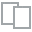
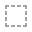
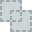
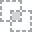
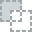
...
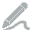
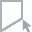
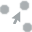
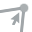
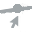

In [126]:
report1 = create_report(df1)
report1

DataPrep Report
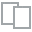
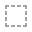
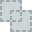
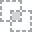
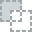
...
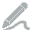
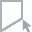
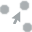
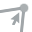
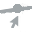

In [386]:
report2 = create_report(df2)
report2

DataPrep Report
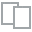
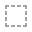
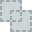
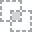
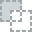
...
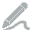
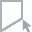
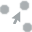
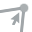
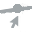

In [387]:
report3 = create_report(df3)
report3

DataPrep Report
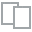
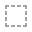
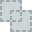
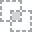
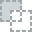
...
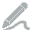
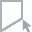
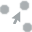
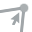
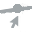

In [388]:
report4 = create_report(df4)
report4

DataPrep Report
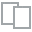
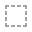
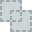
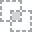
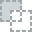
...
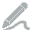
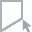
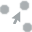
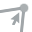
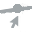

In [389]:
report5 = create_report(df5)
report5

DataPrep Report
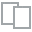
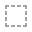
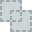
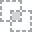
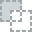
...
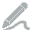
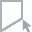
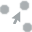
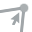
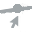

In [390]:
report6 = create_report(df6)
report6

In [359]:
# concatenamos df1 y df2
df=pd.concat([df1,df2], axis=0, ignore_index=True)
df.head()

,countryName,eprtrSectorName,EPRTRAnnexIMainActivityLabel,FacilityInspireID,facilityName,City,targetRelease,pollutant,reportingYear,MONTH,...,CONTINENT,max_wind_speed,avg_wind_speed,min_wind_speed,max_temp,avg_temp,min_temp,DAY WITH FOGS,REPORTER NAME,CITY ID
0,Germany,Mineral industry,Installations for the production of cement cli...,https://registry.gdi-de.org/id/de.ni.mu/062217...,Holcim (Deutschland) GmbH Werk Höver,Sehnde,AIR,Carbon dioxide (CO2),2015,10,...,EUROPE,15.119,14.313,21.419,2.865,4.924,9.688,2,Mr. Jacob Ortega,7cdb5e74adcb2ffaa21c1b61395a984f
1,Italy,Mineral industry,Installations for the production of cement cli...,IT.CAED/240602021.FACILITY,Stabilimento di Tavernola Bergamasca,TAVERNOLA BERGAMASCA,AIR,Nitrogen oxides (NOX),2018,9,...,EUROPE,19.662,19.368,21.756,5.463,7.864,12.024,1,Ashlee Serrano,cd1dbabbdba230b828c657a9b19a8963
2,Spain,Waste and wastewater management,Landfills (excluding landfills of inert waste ...,ES.CAED/001966000.FACILITY,COMPLEJO MEDIOAMBIENTAL DE ZURITA,PUERTO DEL ROSARIO,AIR,Methane (CH4),2019,2,...,EUROPE,12.729,14.702,17.104,1.511,4.233,8.632,2,Vincent Kemp,5011e3fa1436d15b34f1287f312fbada
3,Czechia,Energy sector,Thermal power stations and other combustion in...,CZ.MZP.U422/CZ34736841.FACILITY,Elektrárny Prunéřov,Kadaň,AIR,Nitrogen oxides (NOX),2012,8,...,EUROPE,11.856,16.123,17.537,10.970,10.298,15.179,0,Carol Gray,37a6d7a71c4f7c2469e4f01b70dd90c2
4,Finland,Waste and wastewater management,Urban waste-water treatment plants,http://paikkatiedot.fi/so/1002031/pf/Productio...,"TAMPEREEN VESI LIIKELAITOS, VIINIKANLAHDEN JÄT...",Tampere,AIR,Methane (CH4),2018,12,...,EUROPE,17.112,20.202,21.536,11.772,11.344,16.039,2,Blake Ford,471fe554e1c62d1b01cc8e4e5076c61a


In [360]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37127 entries, 0 to 37126
Data columns (total 21 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   countryName                   37127 non-null  object 
 1   eprtrSectorName               37127 non-null  object 
 2   EPRTRAnnexIMainActivityLabel  37127 non-null  object 
 3   FacilityInspireID             37127 non-null  object 
 4   facilityName                  37127 non-null  object 
 5   City                          37127 non-null  object 
 6   targetRelease                 37127 non-null  object 
 7   pollutant                     37127 non-null  object 
 8   reportingYear                 37127 non-null  int64  
 9   MONTH                         37127 non-null  int64  
 10  DAY                           37127 non-null  int64  
 11  CONTINENT                     37127 non-null  object 
 12  max_wind_speed                37127 non-null  float64
 13  a

In [361]:
# concatenamos df3 df4 y df5
df_r=pd.concat([df3,df4,df5], axis=0, ignore_index=True)
df_r.head()

,,CITY ID,CONTINENT,City,DAY,DAY WITH FOGS,EPRTRAnnexIMainActivityCode,EPRTRAnnexIMainActivityLabel,EPRTRSectorCode,FacilityInspireID,...,countryName,eprtrSectorName,facilityName,max_temp,max_wind_speed,min_temp,min_wind_speed,pollutant,reportingYear,targetRelease
0,47068,4c325d62c064477ef17b4c6e4437e121,EUROPE,Europoort Rotterdam,2,1,4(a),Chemical installations for the production on a...,4,NL.RIVM/000019070.FACILITY,...,Netherlands,Chemical industry,Indorama Ventures Europe BV,13.256816011792559,11.019328717116156,14.696895445152332,20.899761591708206,Carbon dioxide (CO2),2020,AIR
1,32952,f5e609e7095f91cc8ce9ed6d8e774a0d,EUROPE,RION,3,2,3(c),Installations for the production of cement cli...,3,EL.CAED/100075.FACILITY,...,Greece,Mineral industry,TITAN CEMENT S.A. - DREPANO PLANT,4.528859186447803,14.5123950384412,9.219003402711184,23.243402867192145,Nitrogen oxides (NOX),2019,AIR
2,72375,cfab1ba8c67c7c838db98d666f02a132,EUROPE,--,1,12,1(c),Thermal power stations and other combustion in...,1,UK.CAED/BEISOffsh-Cormorant-Alpha.FACILITY,...,United Kingdom,Energy sector,Cormorant Alpha,10.669132597893881,20.26217117993502,14.715465115792192,23.956529199327292,Nitrogen oxides (NOX),2009,AIR
3,40702,95b4e51f7b662598134e1eb956407c74,EUROPE,DRIZZONA,17,1,7(a),Installations for the intensive rearing of pou...,7,IT.CAED/260342003.FACILITY,...,Italy,Intensive livestock production and aquaculture,SOCIETA' AGRICOLA SPARAVALLE DI FERRARI GIUSEP...,7.095681595088376,18.28354666681811,13.582024001859644,26.69626609353847,Methane (CH4),2014,AIR
4,29884,f4433be3b1bfaeeb0633eb65d04b1325,EUROPE,Lünen,6,0,5(a),Installations for the recovery or disposal of ...,5,https://registry.gdi-de.org/id/de.nw.inspire.p...,...,Germany,Waste and wastewater management,Biomassekraftwerk Lünen GmbH,9.886774464050356,13.75940846376134,14.00622637509683,24.768932565830674,Carbon dioxide (CO2),2015,AIR


In [362]:
df_r.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28501 entries, 0 to 28500
Data columns (total 24 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0                                 28501 non-null  object
 1   CITY ID                       28501 non-null  object
 2   CONTINENT                     28501 non-null  object
 3   City                          28501 non-null  object
 4   DAY                           28501 non-null  object
 5   DAY WITH FOGS                 28501 non-null  object
 6   EPRTRAnnexIMainActivityCode   28501 non-null  object
 7   EPRTRAnnexIMainActivityLabel  28501 non-null  object
 8   EPRTRSectorCode               28501 non-null  object
 9   FacilityInspireID             28501 non-null  object
 10  MONTH                         28501 non-null  object
 11  REPORTER NAME                 28501 non-null  object
 12  avg_temp                      28501 non-null  object
 13  avg_wind_speed  

realmente el tipo de contaminante emitido por la empresa es independiente del componente temporal (año, mes dia) o de la velocidad del viento o la temperatura. No son una causa, no influyen en la contaminacion y no es significativo en la prediccion de la variable pollution por lo que podemos ignorarlas

In [363]:
df.head(3)

,countryName,eprtrSectorName,EPRTRAnnexIMainActivityLabel,FacilityInspireID,facilityName,City,targetRelease,pollutant,reportingYear,MONTH,...,CONTINENT,max_wind_speed,avg_wind_speed,min_wind_speed,max_temp,avg_temp,min_temp,DAY WITH FOGS,REPORTER NAME,CITY ID
0,Germany,Mineral industry,Installations for the production of cement cli...,https://registry.gdi-de.org/id/de.ni.mu/062217...,Holcim (Deutschland) GmbH Werk Höver,Sehnde,AIR,Carbon dioxide (CO2),2015,10,...,EUROPE,15.119,14.313,21.419,2.865,4.924,9.688,2,Mr. Jacob Ortega,7cdb5e74adcb2ffaa21c1b61395a984f
1,Italy,Mineral industry,Installations for the production of cement cli...,IT.CAED/240602021.FACILITY,Stabilimento di Tavernola Bergamasca,TAVERNOLA BERGAMASCA,AIR,Nitrogen oxides (NOX),2018,9,...,EUROPE,19.662,19.368,21.756,5.463,7.864,12.024,1,Ashlee Serrano,cd1dbabbdba230b828c657a9b19a8963
2,Spain,Waste and wastewater management,Landfills (excluding landfills of inert waste ...,ES.CAED/001966000.FACILITY,COMPLEJO MEDIOAMBIENTAL DE ZURITA,PUERTO DEL ROSARIO,AIR,Methane (CH4),2019,2,...,EUROPE,12.729,14.702,17.104,1.511,4.233,8.632,2,Vincent Kemp,5011e3fa1436d15b34f1287f312fbada


In [364]:
# añadimos las variables significativas para el modelo NLP
df['descripcion'] = df['eprtrSectorName']+' . '+df['EPRTRAnnexIMainActivityLabel']+' . '+df['FacilityInspireID']
df['pollutant_code'] = df.pollutant.replace(['Carbon dioxide (CO2)', 'Nitrogen oxides (NOX)', 'Methane (CH4)'], [1,0,2])
df.head()

,countryName,eprtrSectorName,EPRTRAnnexIMainActivityLabel,FacilityInspireID,facilityName,City,targetRelease,pollutant,reportingYear,MONTH,...,avg_wind_speed,min_wind_speed,max_temp,avg_temp,min_temp,DAY WITH FOGS,REPORTER NAME,CITY ID,descripcion,pollutant_code
0,Germany,Mineral industry,Installations for the production of cement cli...,https://registry.gdi-de.org/id/de.ni.mu/062217...,Holcim (Deutschland) GmbH Werk Höver,Sehnde,AIR,Carbon dioxide (CO2),2015,10,...,14.313,21.419,2.865,4.924,9.688,2,Mr. Jacob Ortega,7cdb5e74adcb2ffaa21c1b61395a984f,Mineral industry . Installations for the produ...,1
1,Italy,Mineral industry,Installations for the production of cement cli...,IT.CAED/240602021.FACILITY,Stabilimento di Tavernola Bergamasca,TAVERNOLA BERGAMASCA,AIR,Nitrogen oxides (NOX),2018,9,...,19.368,21.756,5.463,7.864,12.024,1,Ashlee Serrano,cd1dbabbdba230b828c657a9b19a8963,Mineral industry . Installations for the produ...,0
2,Spain,Waste and wastewater management,Landfills (excluding landfills of inert waste ...,ES.CAED/001966000.FACILITY,COMPLEJO MEDIOAMBIENTAL DE ZURITA,PUERTO DEL ROSARIO,AIR,Methane (CH4),2019,2,...,14.702,17.104,1.511,4.233,8.632,2,Vincent Kemp,5011e3fa1436d15b34f1287f312fbada,Waste and wastewater management . Landfills (e...,2
3,Czechia,Energy sector,Thermal power stations and other combustion in...,CZ.MZP.U422/CZ34736841.FACILITY,Elektrárny Prunéřov,Kadaň,AIR,Nitrogen oxides (NOX),2012,8,...,16.123,17.537,10.970,10.298,15.179,0,Carol Gray,37a6d7a71c4f7c2469e4f01b70dd90c2,Energy sector . Thermal power stations and oth...,0
4,Finland,Waste and wastewater management,Urban waste-water treatment plants,http://paikkatiedot.fi/so/1002031/pf/Productio...,"TAMPEREEN VESI LIIKELAITOS, VIINIKANLAHDEN JÄT...",Tampere,AIR,Methane (CH4),2018,12,...,20.202,21.536,11.772,11.344,16.039,2,Blake Ford,471fe554e1c62d1b01cc8e4e5076c61a,Waste and wastewater management . Urban waste-...,2


In [365]:

df_r['descripcion'] = df_r['eprtrSectorName']+' . '+df_r['EPRTRAnnexIMainActivityLabel']+' . '+df_r['FacilityInspireID']
df_r['pollutant_code'] = df_r.pollutant.replace(['Carbon dioxide (CO2)', 'Nitrogen oxides (NOX)', 'Methane (CH4)'], [1,0,2])
df_r.head()

,,CITY ID,CONTINENT,City,DAY,DAY WITH FOGS,EPRTRAnnexIMainActivityCode,EPRTRAnnexIMainActivityLabel,EPRTRSectorCode,FacilityInspireID,...,facilityName,max_temp,max_wind_speed,min_temp,min_wind_speed,pollutant,reportingYear,targetRelease,descripcion,pollutant_code
0,47068,4c325d62c064477ef17b4c6e4437e121,EUROPE,Europoort Rotterdam,2,1,4(a),Chemical installations for the production on a...,4,NL.RIVM/000019070.FACILITY,...,Indorama Ventures Europe BV,13.256816011792559,11.019328717116156,14.696895445152332,20.899761591708206,Carbon dioxide (CO2),2020,AIR,Chemical industry . Chemical installations for...,1
1,32952,f5e609e7095f91cc8ce9ed6d8e774a0d,EUROPE,RION,3,2,3(c),Installations for the production of cement cli...,3,EL.CAED/100075.FACILITY,...,TITAN CEMENT S.A. - DREPANO PLANT,4.528859186447803,14.5123950384412,9.219003402711184,23.243402867192145,Nitrogen oxides (NOX),2019,AIR,Mineral industry . Installations for the produ...,0
2,72375,cfab1ba8c67c7c838db98d666f02a132,EUROPE,--,1,12,1(c),Thermal power stations and other combustion in...,1,UK.CAED/BEISOffsh-Cormorant-Alpha.FACILITY,...,Cormorant Alpha,10.669132597893881,20.26217117993502,14.715465115792192,23.956529199327292,Nitrogen oxides (NOX),2009,AIR,Energy sector . Thermal power stations and oth...,0
3,40702,95b4e51f7b662598134e1eb956407c74,EUROPE,DRIZZONA,17,1,7(a),Installations for the intensive rearing of pou...,7,IT.CAED/260342003.FACILITY,...,SOCIETA' AGRICOLA SPARAVALLE DI FERRARI GIUSEP...,7.095681595088376,18.28354666681811,13.582024001859644,26.69626609353847,Methane (CH4),2014,AIR,Intensive livestock production and aquaculture...,2
4,29884,f4433be3b1bfaeeb0633eb65d04b1325,EUROPE,Lünen,6,0,5(a),Installations for the recovery or disposal of ...,5,https://registry.gdi-de.org/id/de.nw.inspire.p...,...,Biomassekraftwerk Lünen GmbH,9.886774464050356,13.75940846376134,14.00622637509683,24.768932565830674,Carbon dioxide (CO2),2015,AIR,Waste and wastewater management . Installation...,1


In [367]:
df_1=df[['descripcion','pollutant_code']]
df_1

,descripcion,pollutant_code
0,Mineral industry . Installations for the produ...,1
1,Mineral industry . Installations for the produ...,0
2,Waste and wastewater management . Landfills (e...,2
3,Energy sector . Thermal power stations and oth...,0
4,Waste and wastewater management . Urban waste-...,2
...,...,...
37122,Paper and wood production and processing . Ind...,0
37123,Energy sector . Thermal power stations and oth...,1
37124,Chemical industry . Chemical installations for...,0
37125,Mineral industry . Installations for the manuf...,1


In [368]:
df_2=df_r[['descripcion','pollutant_code']]
df_2

,descripcion,pollutant_code
0,Chemical industry . Chemical installations for...,1
1,Mineral industry . Installations for the produ...,0
2,Energy sector . Thermal power stations and oth...,0
3,Intensive livestock production and aquaculture...,2
4,Waste and wastewater management . Installation...,1
...,...,...
28496,Energy sector . Thermal power stations and oth...,1
28497,Energy sector . Thermal power stations and oth...,0
28498,Waste and wastewater management . Landfills (e...,2
28499,Mineral industry . Underground mining and rela...,0


In [372]:
# concatenamos todos los datasets
df_=pd.concat([df_1,df_2], axis=0, ignore_index=True)
df_.head()

,descripcion,pollutant_code
0,Mineral industry . Installations for the produ...,1
1,Mineral industry . Installations for the produ...,0
2,Waste and wastewater management . Landfills (e...,2
3,Energy sector . Thermal power stations and oth...,0
4,Waste and wastewater management . Urban waste-...,2


In [400]:
def limpiar_tokenizar(texto,tokenizar=True):
    '''
    Esta función limpia y tokeniza el texto en palabras individuales.
    El orden en el que se va limpiando el texto no es arbitrario.
    El listado de signos de puntuación se ha obtenido de: print(string.punctuation)
    y re.escape(string.punctuation)
    '''
    
    # Se convierte todo el texto a minúsculas
    nuevo_texto = texto.lower()
    # Eliminación de páginas web (palabras que empiezan por "http")
    nuevo_texto = re.sub('http\S+', ' ', nuevo_texto)
    # Eliminación de signos de puntuación
    regex = '[\\!\\"\\#\\$\\%\\&\\\'\\(\\)\\*\\+\\,\\-\\.\\/\\:\\;\\<\\=\\>\\?\\@\\[\\\\\\]\\^_\\`\\{\\|\\}\\~]'
    nuevo_texto = re.sub(regex , ' ', nuevo_texto)
    # Eliminación de palabras que contienen números
    # nuevo_texto = re.sub("\d+", ' ', nuevo_texto)
    raw=[]
    [raw.append(t) for t in nuevo_texto.split(' ') if (len(re.findall('\d+',t)) < 1)]
    nuevo_texto=' '.join(raw)
    # Eliminación de espacios en blanco múltiples
    nuevo_texto = re.sub("\\s+", ' ', nuevo_texto)
    # Eliminación de simbolos
    nuevo_texto = re.sub("[\\<>$+`´|]+", ' ', nuevo_texto)
    if tokenizar:
      # Tokenización por palabras individuales
      nuevo_texto = nuevo_texto.split(sep = ' ')
      # Eliminación de tokens con una longitud < 2
      nuevo_texto = [token for token in nuevo_texto if len(token) > 1]

    return(nuevo_texto)


In [401]:
df_['descripcion_clean'] = df_['descripcion'].apply(lambda x: limpiar_tokenizar(x,False))
df_

,descripcion,pollutant_code,descripcion_clean
0,Mineral industry . Installations for the produ...,1,mineral industry installations for the product...
1,Mineral industry . Installations for the produ...,0,mineral industry installations for the product...
2,Waste and wastewater management . Landfills (e...,2,waste and wastewater management landfills excl...
3,Energy sector . Thermal power stations and oth...,0,energy sector thermal power stations and other...
4,Waste and wastewater management . Urban waste-...,2,waste and wastewater management urban waste wa...
...,...,...,...
65623,Energy sector . Thermal power stations and oth...,1,energy sector thermal power stations and other...
65624,Energy sector . Thermal power stations and oth...,0,energy sector thermal power stations and other...
65625,Waste and wastewater management . Landfills (e...,2,waste and wastewater management landfills excl...
65626,Mineral industry . Underground mining and rela...,0,mineral industry underground mining and relate...


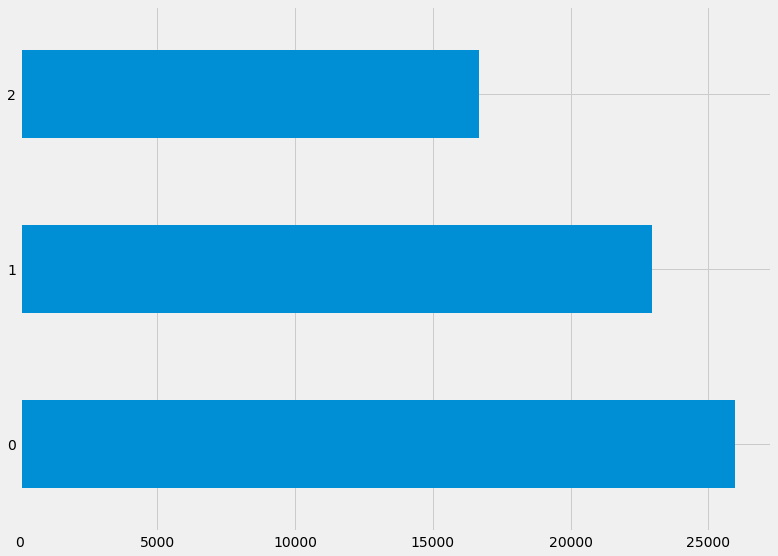

In [406]:
df_.pollutant_code.value_counts().plot(kind='barh')

In [407]:
# se unen todos los textos de cada fila en una sola fila. 
row_list =  []
codes=df_.pollutant_code.value_counts()
for j, code in enumerate(codes.index):
  row1 = ' . '.join(df_[df_.pollutant_code == code]['descripcion_clean'])
  row_list.append([row1])

data = pd.DataFrame(row_list,index=codes.index,columns=['descripcion_clean'])
data

,descripcion_clean
0,mineral industry installations for the product...
1,mineral industry installations for the product...
2,waste and wastewater management landfills excl...


In [408]:

stop_words = set(stopwords.words('english') + list(punctuation))

In [409]:
# Creación de la matriz tf-idf
#==============================================================================
tfidf_vectorizador = TfidfVectorizer(
                        tokenizer  = limpiar_tokenizar,
                        min_df     = 3,
                        stop_words = stop_words
                    )
# tfidf_vectorizador.fit_transform(X_train.apply(lambda x:np.str_(x)))
# X = tfidf_vectorizador.fit_transform(df_clean[~df_clean.Descripción.isna()].Descripción.apply(lambda x:np.str_(x)))
X = tfidf_vectorizador.fit_transform(df_['descripcion_clean'].apply(lambda x:np.str_(x)))

# X = tfidf_vectorizador.fit_transform(data.Descripcion.apply(lambda x:np.str_(x)))
MNYT = X.toarray()
#Obtenemos los feature names
feature_names = np.array(tfidf_vectorizador.get_feature_names())
data_tfidf = pd.DataFrame(MNYT, columns=tfidf_vectorizador.get_feature_names())
# print(feature_names)
print(MNYT)

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.16850469 0.         0.         ... 0.         0.         0.        ]
 ...
 [0.15318563 0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


In [411]:
# Reparto train y test
# ==============================================================================

X_train, X_test, y_train, y_test = train_test_split(
    MNYT,
    df_.pollutant_code,
    test_size = 0.2,
    random_state = 123
)

In [412]:
value, counts = np.unique(y_train, return_counts=True)
print(dict(zip(value, 100 * counts / sum(counts))))
value, counts = np.unique(y_test, return_counts=True)
print(dict(zip(value, 100 * counts / sum(counts))))

{0: 39.59658679669346, 1: 34.88819473543865, 2: 25.51521846786789}
{0: 39.562699984763064, 1: 35.4030169129971, 2: 25.03428310223983}


In [413]:
# df.ETIQUETADO_PREVIO.value_counts().sort_values().plot(kind='barh')
df_.pollutant_code.value_counts()

0    25982
1    22964
2    16682
Name: pollutant_code, dtype: int64

{0: 39.59658679669346, 1: 34.88819473543865, 2: 25.51521846786789}


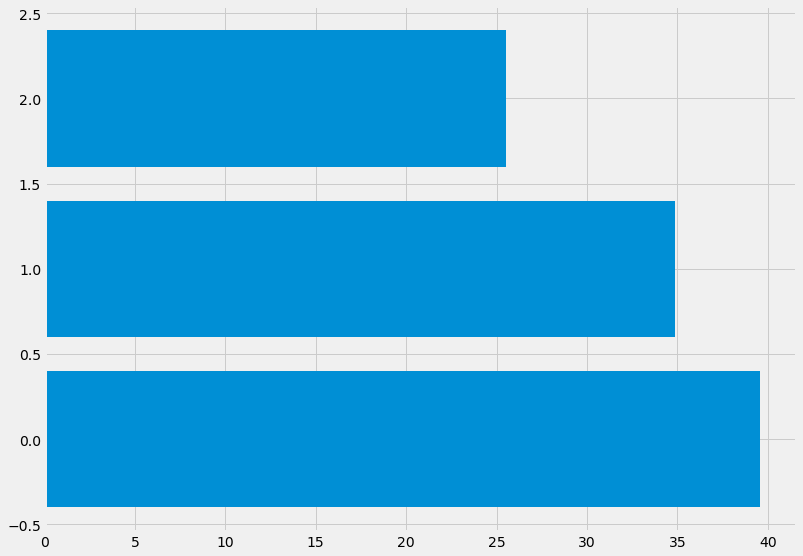

In [414]:
value, counts = np.unique(y_train, return_counts=True)
print(dict(zip(value, 100 * counts / sum(counts))))
D =dict(zip(value, 100 * counts / sum(counts)))
plt.barh(*zip(*D.items()))
# plt.xticks(rotation=90)
plt.show()

{0: 39.562699984763064, 1: 35.4030169129971, 2: 25.03428310223983}


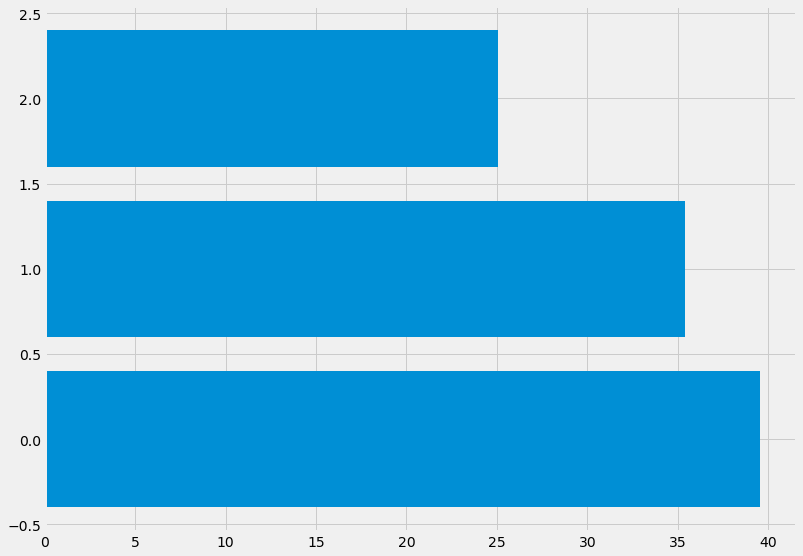

In [415]:
value, counts = np.unique(y_test, return_counts=True)
print(dict(zip(value, 100 * counts / sum(counts))))
D =dict(zip(value, 100 * counts / sum(counts)))
plt.barh(*zip(*D.items()))
# plt.xticks(rotation=90)
plt.show()

In [416]:
print(f" Número de tokens creados: {len(tfidf_vectorizador.get_feature_names())}")
print(tfidf_vectorizador.get_feature_names()[:10])

 Número de tokens creados: 445
['according', 'acetates', 'acid', 'acids', 'active', 'activities', 'activity', 'agents', 'alba', 'alcohols']


### Logistic regresion

In [455]:
#2. Importar clasificador

#Establecemos el método de clasificación (método logistic regression)
classifier = LogisticRegression()
#Entrenamiento del clasificador aplicando el método al corpus de entrenamiento
log_model = classifier.fit(X=X_train, y=y_train)

In [456]:
y_test.size
y_train.size

52502

In [457]:
#Resultados de la clasificación/predicción del clasificador entrenado al corpus de test
y_pred = log_model.predict(X_test)

print("\nCLASES DEL CORPUS DE TEST:\n===============")
print(y_pred)

def most_informative_feature_for_binary_classification(vectorizer, classifier, n=10):
    class_labels = classifier.classes_
    feature_names = vectorizer.get_feature_names()
    topn_class1 = sorted(zip(classifier.coef_[0], feature_names))[:n]
    topn_class2 = sorted(zip(classifier.coef_[0], feature_names))[-n:]

    for coef, feat in topn_class1:
        print (class_labels[0], coef, feat)

    for coef, feat in reversed(topn_class2):
        print (class_labels[1], coef, feat)

print("\nFEATURES MÁS INFORMATIVOS EN LAS CLASES:\n===============")
print(most_informative_feature_for_binary_classification(tfidf_vectorizador, classifier))


CLASES DEL CORPUS DE TEST:
[0 2 1 ... 1 1 2]

FEATURES MÁS INFORMATIVOS EN LAS CLASES:
0 -2.1371310206919585 intensive
0 -1.735656771573337 caed
0 -1.4831557479540296 pigs
0 -1.3579102364134377 sepa
0 -1.3071492578682102 beisoffsh
0 -1.0685655103459792 aquaculture
0 -1.0685655103459792 livestock
0 -1.0685655103459792 rearing
0 -0.9978772199519044 poultry
0 -0.9955894507448408 ch
1 1.8848636946040478 rs
1 1.8201382459687103 nriz
1 1.4974949422000405 curlew
1 1.3564898108366947 recovery
1 1.299501631216423 animal
1 1.1358269432371926 incineration
1 1.0688857960318314 glass
1 0.995985747484978 rotary
1 0.995985747484978 kilns
1 0.8720026850729092 delta
None


-------------
Error de test
-------------
Número de clasificaciones erróneas de un total de 13126 clasificaciones: 5055
% de error: 38.51135151607497
Accuracy: 0.6148864848392503

-------------------
Matriz de confusión
-------------------


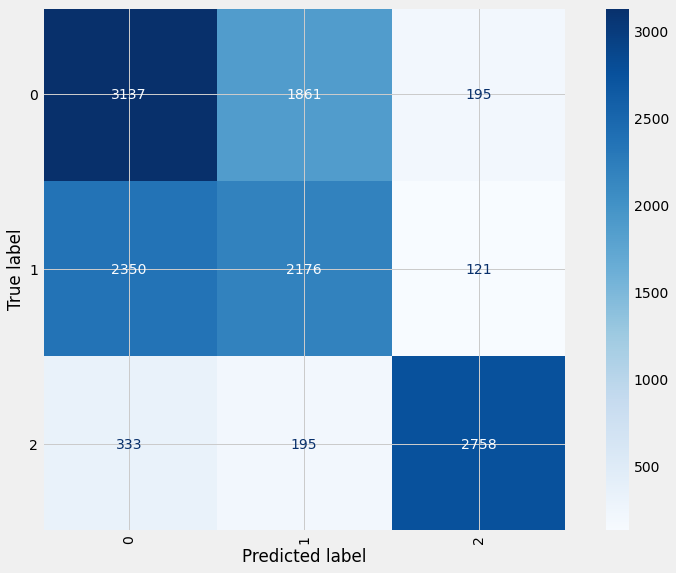

El accuracy de test es: 64.23770833489421 %
              precision    recall  f1-score   support

           0       0.54      0.60      0.57      5193
           1       0.51      0.47      0.49      4647
           2       0.90      0.84      0.87      3286

    accuracy                           0.61     13126
   macro avg       0.65      0.64      0.64     13126
weighted avg       0.62      0.61      0.62     13126



In [458]:
# Error predicciones test
# ==============================================================================
print("-------------")
print("Error de test")
print("-------------")

print(f"Número de clasificaciones erróneas de un total de {len(y_test)} " \
      f"clasificaciones: {(y_test != y_pred).sum()}"
)
print(f"% de error: {100*(y_test != y_pred).mean()}")
print('Accuracy: {}'.format(accuracy_score(y_test,y_pred)))
print("")
print("-------------------")
print("Matriz de confusión")
print("-------------------")
cm=confusion_matrix(y_true = y_test, y_pred= y_pred)

ls=classifier.classes_

disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=ls)

# sns.heatmap(disp.confusion_matrix,annot=True,cmap='Blues',square=True,fmt='d')
disp.plot(include_values=True, cmap='Blues',values_format='d',xticks_rotation='vertical')
plt.show()
print(f"El accuracy de test es: {100 * f1_score(y_test, y_pred, average='macro')} %")
print(classification_report(y_test,y_pred))

## SVM

In [421]:
# Entrenamiento del modelo SVM
# ==============================================================================
modelo_svm_lineal_tarea = svm.SVC(kernel= "linear", C = 2.154434690031882)
modelo_svm_lineal_tarea.fit(X=X_train, y= y_train)


SVC(C=2.154434690031882, kernel='linear')

-------------
Error de test
-------------
Número de clasificaciones erróneas de un total de 13126 clasificaciones: 5058
% de error: 38.534206917568184
Accuracy: 0.6146579308243182

-------------------
Matriz de confusión
-------------------


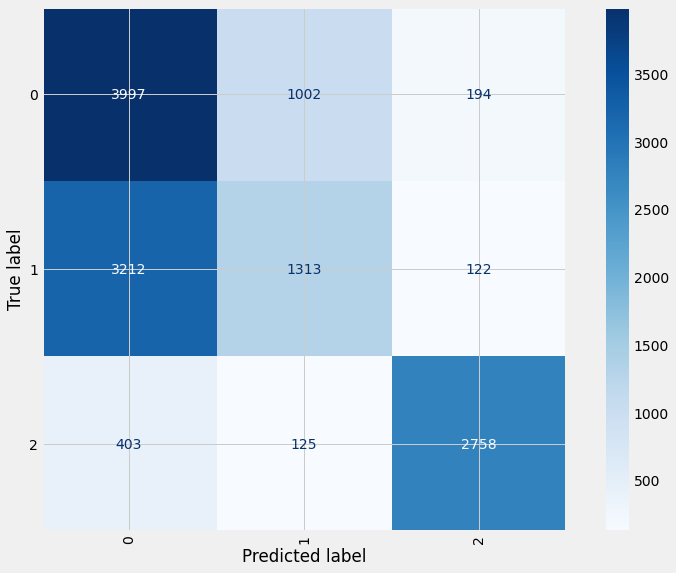

              precision    recall  f1-score   support

           0       0.53      0.77      0.62      5193
           1       0.54      0.28      0.37      4647
           2       0.90      0.84      0.87      3286

    accuracy                           0.61     13126
   macro avg       0.65      0.63      0.62     13126
weighted avg       0.62      0.61      0.60     13126



In [422]:
# Error predicciones test
# ==============================================================================
y_pred = modelo_svm_lineal_tarea.predict(X=X_test)

print("-------------")
print("Error de test")
print("-------------")

print(f"Número de clasificaciones erróneas de un total de {X_test.shape[0]} " \
      f"clasificaciones: {(y_test != y_pred).sum()}"
)
print(f"% de error: {100*(y_test != y_pred).mean()}")
print('Accuracy: {}'.format(accuracy_score(y_test,y_pred)))
print("")
print("-------------------")
print("Matriz de confusión")
print("-------------------")
cm=confusion_matrix(y_true = y_test, y_pred= y_pred)
# pd.DataFrame(cm,
#              columns= list(y_test.unique()),
#              index = list(y_test.unique()))

# cm=confusion_matrix(y_pred.argmax(axis=1),test_y.argmax(axis=1))
# ls=df_clean.ETIQUETADO_previo_2.unique().tolist()
ls=modelo_svm_lineal_tarea.classes_
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=ls)

# sns.heatmap(disp.confusion_matrix,annot=True,cmap='Blues',square=True,fmt='d')
disp.plot(include_values=True, cmap='Blues',values_format='d',xticks_rotation='vertical')
plt.show()

print(classification_report(y_test,y_pred))

In [348]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.52      0.75      0.62      2898
           1       0.55      0.31      0.40      2685
           2       0.90      0.84      0.87      1843

    accuracy                           0.62      7426
   macro avg       0.66      0.64      0.63      7426
weighted avg       0.63      0.62      0.60      7426



## Random Forest

Matriz de confusión
-------------------


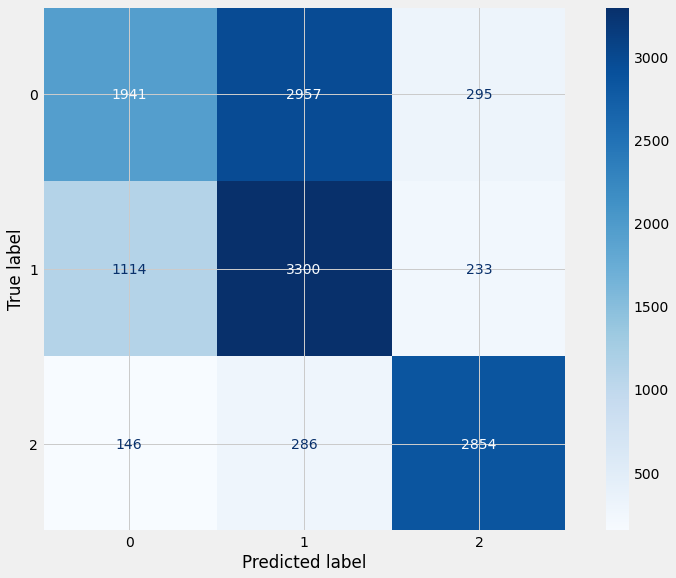


El accuracy de test es: 63.61047739400717 %


In [423]:
forest = RandomForestClassifier(class_weight='balanced',random_state=123)
# balanced", "balanced_subsample"
modelF = forest.fit(X_train, y_train)
predicciones = modelF.predict(X_test)

mat_confusion = confusion_matrix(
                    y_true    = y_test,
                    y_pred    = predicciones
                )

accuracy = accuracy_score(
            y_true    = y_test,
            y_pred    = predicciones,
            normalize = True
           )

print("Matriz de confusión")
print("-------------------")
# print(mat_confusion)
disp = ConfusionMatrixDisplay(confusion_matrix=mat_confusion, display_labels=modelF.classes_)
disp.plot(cmap=plt.cm.Blues)
plt.show()
print("")
print(f"El accuracy de test es: {100 * f1_score(y_test, predicciones, average='macro')} %")

In [424]:
print(
    classification_report(
        y_true = y_test,
        y_pred = predicciones
    )
)

              precision    recall  f1-score   support

           0       0.61      0.37      0.46      5193
           1       0.50      0.71      0.59      4647
           2       0.84      0.87      0.86      3286

    accuracy                           0.62     13126
   macro avg       0.65      0.65      0.64     13126
weighted avg       0.63      0.62      0.61     13126



buscamos los mejores valores de los hiperparametros

In [425]:
n_estimators = [20, 50, 100, 300, 500, 800]
max_depth = [2, 5, 8, 15, 25, 30]
min_samples_split = [2, 5, 10, 15]
min_samples_leaf = [1, 2, 4, 10]

In [426]:
train_scoreNum, test_scoreNum = validation_curve(
                                RandomForestClassifier(class_weight='balanced'),
                                X = X_train, y = y_train,
                                param_name = 'n_estimators',
                                param_range = n_estimators, cv = 3)

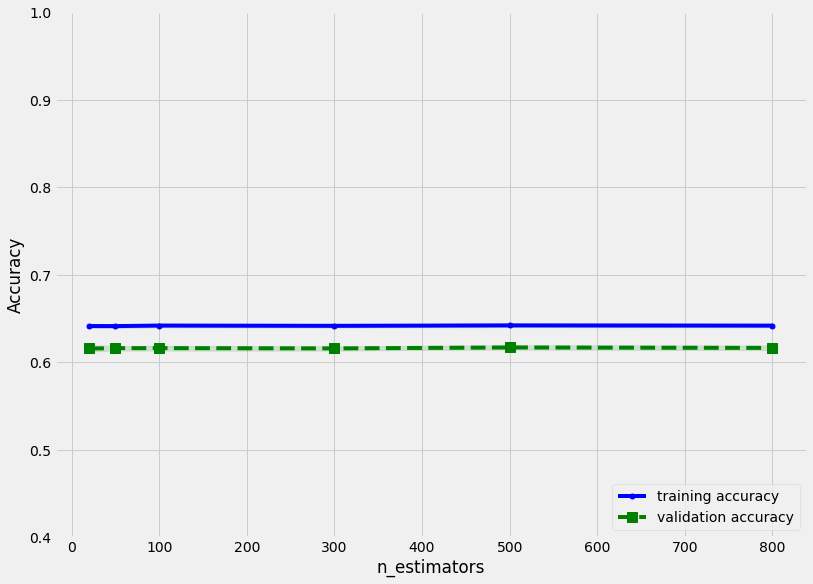

In [427]:
train_mean = np.mean(train_scoreNum, axis=1)
train_std = np.std(train_scoreNum, axis=1)
test_mean = np.mean(test_scoreNum, axis=1)
test_std = np.std(test_scoreNum, axis=1)

plt.plot(n_estimators, train_mean,    color='blue', marker='o',
    markersize=5,
    label='training accuracy')
plt.fill_between(n_estimators, train_mean + train_std,
    train_mean - train_std, alpha=0.15,
    color='blue')
plt.plot(n_estimators, test_mean,
    color='green', linestyle='--',
    marker='s', markersize=10,
    label='validation accuracy')
plt.fill_between(n_estimators,
    test_mean + test_std,
    test_mean - test_std,
    alpha=0.15, color='green')
plt.grid(True)
plt.legend(loc='lower right')
plt.xlabel('n_estimators')
plt.ylabel('Accuracy')
plt.ylim([0.4, 1.0])
plt.show()

In [430]:
train_scoreNum, test_scoreNum = validation_curve(
                                RandomForestClassifier(class_weight='balanced'),
                                X = X_train, y = y_train,
                                param_name = 'max_depth',
                                param_range = max_depth, cv = 3)

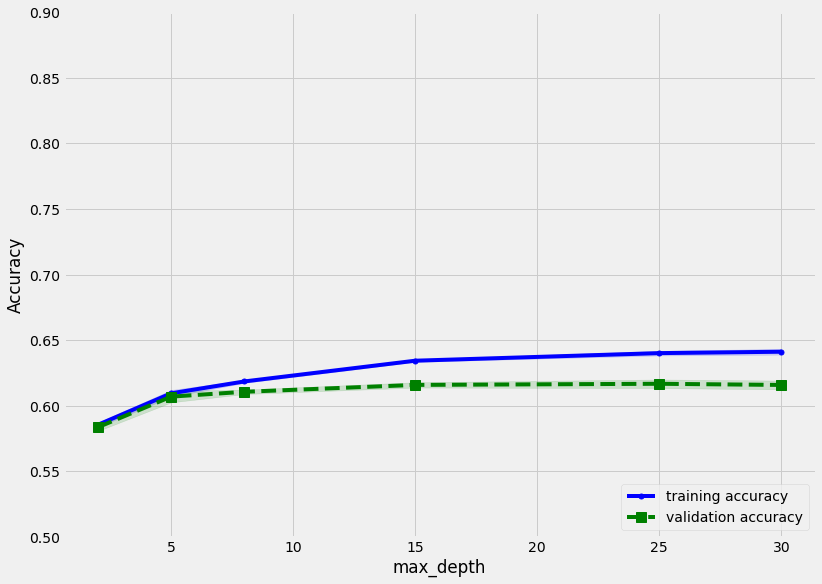

In [433]:
train_mean = np.mean(train_scoreNum, axis=1)
train_std = np.std(train_scoreNum, axis=1)
test_mean = np.mean(test_scoreNum, axis=1)
test_std = np.std(test_scoreNum, axis=1)

plt.plot(max_depth, train_mean,    color='blue', marker='o',
    markersize=5,
    label='training accuracy')
plt.fill_between(max_depth, train_mean + train_std,
    train_mean - train_std, alpha=0.15,
    color='blue')
plt.plot(max_depth, test_mean,
    color='green', linestyle='--',
    marker='s', markersize=10,
    label='validation accuracy')
plt.fill_between(max_depth,
    test_mean + test_std,
    test_mean - test_std,
    alpha=0.15, color='green')
plt.grid(True)
plt.legend(loc='lower right')
plt.xlabel('max_depth')
plt.ylabel('Accuracy')
plt.ylim([0.5, 0.9])
plt.show()

In [434]:
train_scoreNum, test_scoreNum = validation_curve(
                                RandomForestClassifier(class_weight='balanced'),
                                X = X_train, y = y_train,
                                param_name = 'min_samples_split',
                                param_range = min_samples_split, cv = 3)

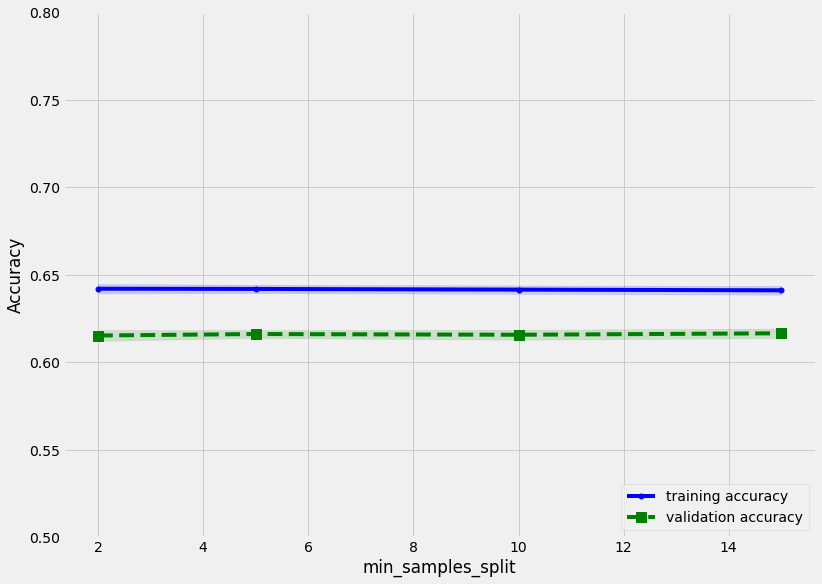

In [436]:
train_mean = np.mean(train_scoreNum, axis=1)
train_std = np.std(train_scoreNum, axis=1)
test_mean = np.mean(test_scoreNum, axis=1)
test_std = np.std(test_scoreNum, axis=1)

plt.plot(min_samples_split, train_mean,    color='blue', marker='o',
    markersize=5,
    label='training accuracy')
plt.fill_between(min_samples_split, train_mean + train_std,
    train_mean - train_std, alpha=0.15,
    color='blue')
plt.plot(min_samples_split, test_mean,
    color='green', linestyle='--',
    marker='s', markersize=10,
    label='validation accuracy')
plt.fill_between(min_samples_split,
    test_mean + test_std,
    test_mean - test_std,
    alpha=0.15, color='green')
plt.grid(True)
plt.legend(loc='lower right')
plt.xlabel('min_samples_split')
plt.ylabel('Accuracy')
plt.ylim([0.5, 0.8])
plt.show()

In [437]:
train_scoreNum, test_scoreNum = validation_curve(
                                RandomForestClassifier(class_weight='balanced'),
                                X = X_train, y = y_train,
                                param_name = 'min_samples_leaf',
                                param_range = min_samples_leaf, cv = 3)

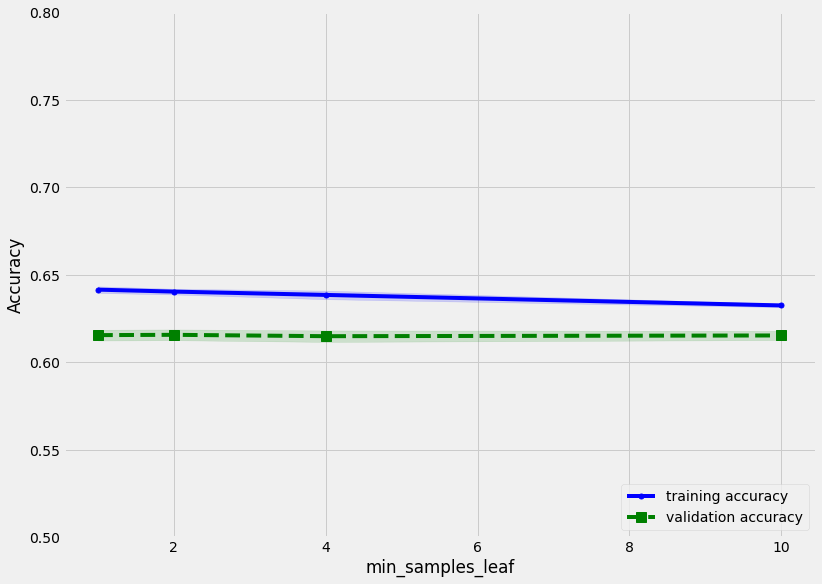

In [439]:
train_mean = np.mean(train_scoreNum, axis=1)
train_std = np.std(train_scoreNum, axis=1)
test_mean = np.mean(test_scoreNum, axis=1)
test_std = np.std(test_scoreNum, axis=1)

plt.plot(min_samples_leaf, train_mean,    color='blue', marker='o',
    markersize=5,
    label='training accuracy')
plt.fill_between(min_samples_leaf, train_mean + train_std,
    train_mean - train_std, alpha=0.15,
    color='blue')
plt.plot(min_samples_leaf, test_mean,
    color='green', linestyle='--',
    marker='s', markersize=10,
    label='validation accuracy')
plt.fill_between(min_samples_leaf,
    test_mean + test_std,
    test_mean - test_std,
    alpha=0.15, color='green')
plt.grid(True)
plt.legend(loc='lower right')
plt.xlabel('min_samples_leaf')
plt.ylabel('Accuracy')
plt.ylim([0.5, 0.8])
plt.show()

Matriz de confusión
-------------------


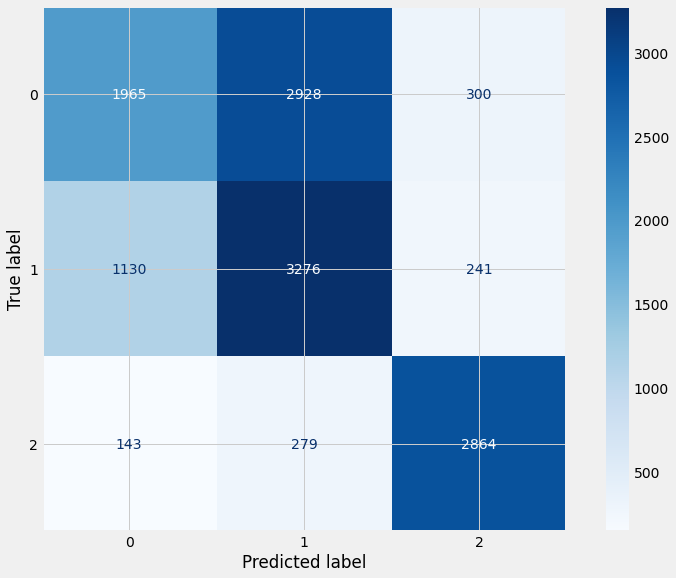


El accuracy de test es: 63.69638153873267 %


In [453]:
# forest = RandomForestClassifier(class_weight='balanced',random_state=123)
forestVC = RandomForestClassifier(random_state = 123,
                                  n_estimators = 100,
                                  max_depth = 30, 
                                  min_samples_split = 2,  
                                  min_samples_leaf = 1,
                                  class_weight='balanced') 
# balanced", "balanced_subsample"
modelFVC = forestVC.fit(X_train, y_train)
predicciones = modelFVC.predict(X_test)

mat_confusion = confusion_matrix(
                    y_true    = y_test,
                    y_pred    = predicciones
                )

accuracy = accuracy_score(
            y_true    = y_test,
            y_pred    = predicciones,
            normalize = True
           )

print("Matriz de confusión")
print("-------------------")
# print(mat_confusion)
disp = ConfusionMatrixDisplay(confusion_matrix=mat_confusion, display_labels=modelFVC.classes_)
disp.plot(cmap=plt.cm.Blues)
plt.show()
print("")
print(f"El accuracy de test es: {100 * f1_score(y_test, predicciones, average='macro')} %")

In [454]:
print(
    classification_report(
        y_true = y_test,
        y_pred = predicciones
    )
)

              precision    recall  f1-score   support

           0       0.61      0.38      0.47      5193
           1       0.51      0.70      0.59      4647
           2       0.84      0.87      0.86      3286

    accuracy                           0.62     13126
   macro avg       0.65      0.65      0.64     13126
weighted avg       0.63      0.62      0.61     13126



Recuperamos el mejor modelo (regresion logistica) y realizamos la prediccion sobre el conjunto de test

In [460]:
test=pd.read_csv('/content/test_x.csv')
test.head()

,test_index,countryName,EPRTRSectorCode,eprtrSectorName,EPRTRAnnexIMainActivityCode,EPRTRAnnexIMainActivityLabel,FacilityInspireID,facilityName,City,targetRelease,...,CONTINENT,max_wind_speed,avg_wind_speed,min_wind_speed,max_temp,avg_temp,min_temp,DAY WITH FOGS,REPORTER NAME,CITY ID
0,0,Poland,3,Mineral industry,3(a),Underground mining and related operations,PL.MŚ/000002357.FACILITY,Polska Grupa Górnicza sp. z o.o. Oddział KWK R...,Rydułtowy,AIR,...,EUROPE,14.080,14.856,18.475,10.279,11.381,13.481,1,Brittany Buck,826b1de9dad293ae3e4f9cbaf6cf3420
1,1,Luxembourg,5,Waste and wastewater management,5(d),Landfills (excluding landfills of inert waste ...,LU.CAED/000012000.FACILITY,Sidec,Diekirch,AIR,...,EUROPE,16.052,17.624,22.623,6.626,8.840,13.423,0,Lauren Fisher,ed30a6667b40ba0a66198b3173e7353f
2,2,Netherlands,1,Energy sector,1(c),Thermal power stations and other combustion in...,NL.EEA/212857.FACILITY,Nuon Power Generation BV (Eemshaven),Eemshaven,AIR,...,EUROPE,13.647,15.542,17.819,5.669,8.403,11.276,2,Linda Thompson,78e1082c3cfef3bdf3554da8d6afcc34
3,3,Sweden,5,Waste and wastewater management,5(d),Landfills (excluding landfills of inert waste ...,SE.CAED/10013901.Facility,HÖGBYTORPS AVFALLSANLÄGGNING,BRO,AIR,...,EUROPE,16.337,17.458,19.962,6.161,7.572,9.444,2,Bethany Mcmillan,27f959641950d381869d746d7d0e7d4e
4,4,Portugal,1,Energy sector,1(c),Thermal power stations and other combustion in...,PT.EEA/133926.FACILITY,SPCG - Sociedade Portuguesa de Co-Geração Eléc...,SETÚBAL,AIR,...,EUROPE,21.517,20.532,21.617,10.964,11.548,12.624,2,Sarah Hoffman,1cb71655d9e0bd5cedb2320bf5fdd8f7


In [462]:
test['descripcion'] = test['eprtrSectorName']+' . '+test['EPRTRAnnexIMainActivityLabel']+' . '+test['FacilityInspireID']
test.head()

,test_index,countryName,EPRTRSectorCode,eprtrSectorName,EPRTRAnnexIMainActivityCode,EPRTRAnnexIMainActivityLabel,FacilityInspireID,facilityName,City,targetRelease,...,max_wind_speed,avg_wind_speed,min_wind_speed,max_temp,avg_temp,min_temp,DAY WITH FOGS,REPORTER NAME,CITY ID,descripcion
0,0,Poland,3,Mineral industry,3(a),Underground mining and related operations,PL.MŚ/000002357.FACILITY,Polska Grupa Górnicza sp. z o.o. Oddział KWK R...,Rydułtowy,AIR,...,14.080,14.856,18.475,10.279,11.381,13.481,1,Brittany Buck,826b1de9dad293ae3e4f9cbaf6cf3420,Mineral industry . Underground mining and rela...
1,1,Luxembourg,5,Waste and wastewater management,5(d),Landfills (excluding landfills of inert waste ...,LU.CAED/000012000.FACILITY,Sidec,Diekirch,AIR,...,16.052,17.624,22.623,6.626,8.840,13.423,0,Lauren Fisher,ed30a6667b40ba0a66198b3173e7353f,Waste and wastewater management . Landfills (e...
2,2,Netherlands,1,Energy sector,1(c),Thermal power stations and other combustion in...,NL.EEA/212857.FACILITY,Nuon Power Generation BV (Eemshaven),Eemshaven,AIR,...,13.647,15.542,17.819,5.669,8.403,11.276,2,Linda Thompson,78e1082c3cfef3bdf3554da8d6afcc34,Energy sector . Thermal power stations and oth...
3,3,Sweden,5,Waste and wastewater management,5(d),Landfills (excluding landfills of inert waste ...,SE.CAED/10013901.Facility,HÖGBYTORPS AVFALLSANLÄGGNING,BRO,AIR,...,16.337,17.458,19.962,6.161,7.572,9.444,2,Bethany Mcmillan,27f959641950d381869d746d7d0e7d4e,Waste and wastewater management . Landfills (e...
4,4,Portugal,1,Energy sector,1(c),Thermal power stations and other combustion in...,PT.EEA/133926.FACILITY,SPCG - Sociedade Portuguesa de Co-Geração Eléc...,SETÚBAL,AIR,...,21.517,20.532,21.617,10.964,11.548,12.624,2,Sarah Hoffman,1cb71655d9e0bd5cedb2320bf5fdd8f7,Energy sector . Thermal power stations and oth...


In [464]:
test_ = test[['test_index','descripcion']]
test_.head()

,test_index,descripcion
0,0,Mineral industry . Underground mining and rela...
1,1,Waste and wastewater management . Landfills (e...
2,2,Energy sector . Thermal power stations and oth...
3,3,Waste and wastewater management . Landfills (e...
4,4,Energy sector . Thermal power stations and oth...


In [466]:
test_['descripcion_clean'] = test_['descripcion'].apply(lambda x: limpiar_tokenizar(x,False))
test_.head()

,test_index,descripcion,descripcion_clean
0,0,Mineral industry . Underground mining and rela...,mineral industry underground mining and relate...
1,1,Waste and wastewater management . Landfills (e...,waste and wastewater management landfills excl...
2,2,Energy sector . Thermal power stations and oth...,energy sector thermal power stations and other...
3,3,Waste and wastewater management . Landfills (e...,waste and wastewater management landfills excl...
4,4,Energy sector . Thermal power stations and oth...,energy sector thermal power stations and other...


In [467]:
test_m = tfidf_vectorizador.transform(test_['descripcion'])
test_m = test_m.toarray()
test_m

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.15865049, 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.17298354, 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.16209261, 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]])

In [468]:
predicciones_test = log_model.predict(test_m)
predicciones_test

array([2, 2, 1, ..., 2, 1, 2])

In [475]:
test_['pollutant']=predicciones_test
test_.head()

,test_index,descripcion,descripcion_clean,pollutant
0,0,Mineral industry . Underground mining and rela...,mineral industry underground mining and relate...,2
1,1,Waste and wastewater management . Landfills (e...,waste and wastewater management landfills excl...,2
2,2,Energy sector . Thermal power stations and oth...,energy sector thermal power stations and other...,1
3,3,Waste and wastewater management . Landfills (e...,waste and wastewater management landfills excl...,2
4,4,Energy sector . Thermal power stations and oth...,energy sector thermal power stations and other...,0


In [489]:
test_.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24480 entries, 0 to 24479
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   test_index         24480 non-null  int64 
 1   descripcion        24480 non-null  object
 2   descripcion_clean  24480 non-null  object
 3   pollutant          24480 non-null  int64 
dtypes: int64(2), object(2)
memory usage: 765.1+ KB


In [476]:
# guardamos formato csv
test_.drop(columns=['descripcion','descripcion_clean']).to_csv('predictions.csv', index=False)


In [491]:
result = test_.drop(columns=['descripcion','descripcion_clean']).to_json(orient="columns")
result

'{"test_index":{"0":0,"1":1,"2":2,"3":3,"4":4,"5":5,"6":6,"7":7,"8":8,"9":9,"10":10,"11":11,"12":12,"13":13,"14":14,"15":15,"16":16,"17":17,"18":18,"19":19,"20":20,"21":21,"22":22,"23":23,"24":24,"25":25,"26":26,"27":27,"28":28,"29":29,"30":30,"31":31,"32":32,"33":33,"34":34,"35":35,"36":36,"37":37,"38":38,"39":39,"40":40,"41":41,"42":42,"43":43,"44":44,"45":45,"46":46,"47":47,"48":48,"49":49,"50":50,"51":51,"52":52,"53":53,"54":54,"55":55,"56":56,"57":57,"58":58,"59":59,"60":60,"61":61,"62":62,"63":63,"64":64,"65":65,"66":66,"67":67,"68":68,"69":69,"70":70,"71":71,"72":72,"73":73,"74":74,"75":75,"76":76,"77":77,"78":78,"79":79,"80":80,"81":81,"82":82,"83":83,"84":84,"85":85,"86":86,"87":87,"88":88,"89":89,"90":90,"91":91,"92":92,"93":93,"94":94,"95":95,"96":96,"97":97,"98":98,"99":99,"100":100,"101":101,"102":102,"103":103,"104":104,"105":105,"106":106,"107":107,"108":108,"109":109,"110":110,"111":111,"112":112,"113":113,"114":114,"115":115,"116":116,"117":117,"118":118,"119":119,"120

In [497]:
#guardamos en formato json
import json
with open('predictions.json', 'w') as fp:
    parsed = json.loads(result)
    json.dump(parsed, fp,indent=2)
